In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.colors as colors
import matplotlib.patches as mpatches
from pandas import cut
from matplotlib import colormaps as cmap
import folium

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 8)
plt.style.use("ggplot")

C:\Users\Kassidi\AppData\Local\Temp\ipykernel_19168\1146543900.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [8]:
health_cols = [
    'Census tract 2010 ID', 
    'County Name', 
    'State/Territory',
    'Total population', 
    'Percent American Indian / Alaska Native', 
    'Percent Asian', 'Percent Black or African American alone', 
    'Percent Hispanic or Latino', 
    'Percent Native Hawaiian or Pacific',
    'Percent other races', 
    'Percent White',
    'Coronary heart disease among adults aged greater than or equal to 18 years', 
    'Coronary heart disease among adults aged greater than or equal to 18 years (percentile)', 
    'Current asthma among adults aged greater than or equal to 18 years', 
    'Current asthma among adults aged greater than or equal to 18 years (percentile)',
    'Diagnosed diabetes among adults aged greater than or equal to 18 years',
    'Diagnosed diabetes among adults aged greater than or equal to 18 years (percentile)',
    'Low life expectancy (percentile)', 
    'Percent age 10 to 64', 
    'Percent age over 64', 
    'Percent age under 10'
]

In [9]:
health_stats = pd.read_csv(r"C:\\New_499_Code\\499_Cleaned_Abbreviated_CEJST_Disadvantaged_Communities_Data.csv", usecols=health_cols)
health_stats.head(2)

,Census tract 2010 ID,County Name,State/Territory,Percent Black or African American alone,Percent American Indian / Alaska Native,Percent Asian,Percent Native Hawaiian or Pacific,Percent White,Percent Hispanic or Latino,Percent other races,...,Percent age 10 to 64,Percent age over 64,Total population,Current asthma among adults aged greater than or equal to 18 years (percentile),Current asthma among adults aged greater than or equal to 18 years,Diagnosed diabetes among adults aged greater than or equal to 18 years (percentile),Diagnosed diabetes among adults aged greater than or equal to 18 years,Coronary heart disease among adults aged greater than or equal to 18 years (percentile),Coronary heart disease among adults aged greater than or equal to 18 years,Low life expectancy (percentile)
0,1001020100,Autauga County,Alabama,0.07,0.0,0.0,0.00,0.83,0.01,0.0,...,0.76,0.13,1993.0,57.0,990.0,60.0,1130.0,59.0,640.0,89.0
1,1001020200,Autauga County,Alabama,0.57,0.0,0.0,0.01,0.38,0.01,0.0,...,0.73,0.14,1959.0,82.0,1100.0,83.0,1420.0,49.0,590.0,65.0


In [11]:
CEJST_shapefile_path = r"C:\New_499_Code\cb_2021_us_tract_500k\cb_2021_us_tract_500k.shp"
CEJST_Shapefile = gpd.read_file(CEJST_shapefile_path)

# Filter the GeoDataFrame because it takes 20 minutes to run otherwise
filtered_CEJST_Shapefile = CEJST_Shapefile[CEJST_Shapefile['STATE_NAME'].isin(['Tennessee'])]
filtered_CEJST_Shapefile.head(2)

,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,LSAD,ALAND,AWATER,geometry
361,47,037,015805,1400000US47037015805,47037015805,158.05,Census Tract 158.05,TN,Davidson County,Tennessee,CT,2272173,0,"POLYGON ((-86.71746 36.12302, -86.71703 36.123..."
542,47,179,060800,1400000US47179060800,47179060800,608,Census Tract 608,TN,Washington County,Tennessee,CT,2315123,0,"POLYGON ((-82.36523 36.30877, -82.36357 36.309..."


In [12]:
#merge the environmental data with the shapefile, keep all columns 
health_stats = filtered_CEJST_Shapefile.merge(health_stats, left_on='NAMELSADCO', right_on='County Name', how='left')
health_stats.head(2)

,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,STATE_NAME,...,Percent age 10 to 64,Percent age over 64,Total population,Current asthma among adults aged greater than or equal to 18 years (percentile),Current asthma among adults aged greater than or equal to 18 years,Diagnosed diabetes among adults aged greater than or equal to 18 years (percentile),Diagnosed diabetes among adults aged greater than or equal to 18 years,Coronary heart disease among adults aged greater than or equal to 18 years (percentile),Coronary heart disease among adults aged greater than or equal to 18 years,Low life expectancy (percentile)
0,47,037,015805,1400000US47037015805,47037015805,158.05,Census Tract 158.05,TN,Davidson County,Tennessee,...,0.72,0.10,5566.0,40.0,930.0,20.0,810.0,19.0,440.0,20.0
1,47,037,015805,1400000US47037015805,47037015805,158.05,Census Tract 158.05,TN,Davidson County,Tennessee,...,0.72,0.19,7593.0,24.0,869.0,38.0,950.0,49.0,590.0,18.0


In [ ]:
#check to see if health_stats is a geoDataFrame
type(health_stats)

geopandas.geodataframe.GeoDataFrame

In [16]:
health_stats_filtered = health_stats[health_stats['STATE_NAME'] == 'Tennessee']

In [17]:
print(health_stats.crs)

EPSG:4269


In [ ]:
from sklearn.preprocessing import MinMaxScaler
health_stats = health_stats.applymap(lambda x: 1 if x is True else (0 if x is False else x))

# Normalize the columns using MinMaxScaler (scaling values health_stats 0 and 1)
scaler = MinMaxScaler()

# Selecting the columns to scale
columns_to_scale = [
    'Coronary heart disease among adults aged greater than or equal to 18 years',
    'Current asthma among adults aged greater than or equal to 18 years',
    'Diagnosed diabetes among adults aged greater than or equal to 18 years'
]

# Scaling the columns
health_stats[columns_to_scale] = scaler.fit_transform(health_stats[columns_to_scale])
                                                                                                                                                                      

# Calculating the Health Score by combining the scaled metrics
# Using equal weights for now; this can be adjusted based on importance
health_stats['Health Score'] = (
    health_stats['Coronary heart disease among adults aged greater than or equal to 18 years'] +
    health_stats['Current asthma among adults aged greater than or equal to 18 years'] +
    health_stats['Diagnosed diabetes among adults aged greater than or equal to 18 years'] 
) / 3  # Dividing by 3 


# Displaying the results
print(health_stats[['Census tract 2010 ID', 'County Name', 'Health Score']])

C:\Users\Kassidi\AppData\Local\Temp\ipykernel_19168\1045876482.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  health_stats = health_stats.applymap(lambda x: 1 if x is True else (0 if x is False else x))


        Census tract 2010 ID      County Name  Health Score
0                37057060101  Davidson County      0.220487
1                37057060102  Davidson County      0.245786
2                37057060201  Davidson County      0.318352
3                37057060202  Davidson County      0.365253
4                37057060203  Davidson County      0.280844
...                      ...              ...           ...
314983           48313000200   Madison County      0.318275
314984           48313000300   Madison County      0.308442
314985           48313000400   Madison County      0.326354
314986           51113930100   Madison County      0.337121
314987           51113930200   Madison County      0.324577

[314988 rows x 3 columns]


In [21]:
from shapely.ops import unary_union

# Create a copy of the GeoDataFrame
health_stats_copy = health_stats.copy()

# Use 'unary_union' to combine multiple geometries for the same county
health_stats_copy = health_stats_copy.groupby(['County Name', 'State/Territory']).agg(
    {
        'Total population': 'mean',
        'Percent American Indian / Alaska Native': 'mean',
        'Percent Asian': 'mean',
        'Percent Black or African American alone': 'mean',
        'Percent Hispanic or Latino': 'mean',
        'Percent Native Hawaiian or Pacific': 'mean',
        'geometry': lambda x: unary_union(x),  # Combine multiple geometries
        'Coronary heart disease among adults aged greater than or equal to 18 years': 'mean',
        'Coronary heart disease among adults aged greater than or equal to 18 years (percentile)': 'mean',
        'Current asthma among adults aged greater than or equal to 18 years': 'mean',
        'Current asthma among adults aged greater than or equal to 18 years (percentile)': 'mean',
        'Diagnosed diabetes among adults aged greater than or equal to 18 years': 'mean',
        'Diagnosed diabetes among adults aged greater than or equal to 18 years (percentile)': 'mean',
        'Low life expectancy (percentile)': 'mean',
        'Percent age 10 to 64': 'mean',
        'Percent age over 64': 'mean',
        'Percent age under 10': 'mean',
        'Health Score': 'mean'
    }
).reset_index()

# Convert the dataframe back to a GeoDataFrame
health_stats_copy = gpd.GeoDataFrame(health_stats_copy)

# Check if the GeoDataFrame is correct
type(health_stats_copy)



geopandas.geodataframe.GeoDataFrame

In [25]:
county_health_map = health_stats_copy.set_geometry('geometry') 

# Create the map with the first layer (Health Score)
county_health_map = health_stats_copy.explore(
    column="Health Score",
    scheme="naturalbreaks", 
    legend=False, 
    k=5, 
    tooltip=False, 
    popup=['County Name', 'Health Score'],
    legend_kwds=dict(colorbar=False),  
    name="Health Score",  
    width="80%",  
    height="500px"  
)

# Add the tile layer to the map
folium.TileLayer("CartoDB positron", show=False).add_to(county_health_map)

# Add the second layer (Energy Burden) to the same map
health_stats_copy.explore(
    m=county_health_map,  
    column="Coronary heart disease among adults aged greater than or equal to 18 years",
    scheme="naturalbreaks", 
    legend=False, 
    k=5, 
    tooltip=False, 
    popup=['County Name', 'Coronary heart disease among adults aged greater than or equal to 18 years'],
    legend_kwds=dict(colorbar=False),  
    name="Coronary heart disease among adults aged greater than or equal to 18 years", 
    cmap="Reds" 
)

# Add a Layer Control to toggle layers
folium.LayerControl().add_to(county_health_map)

# Display the map
county_health_map


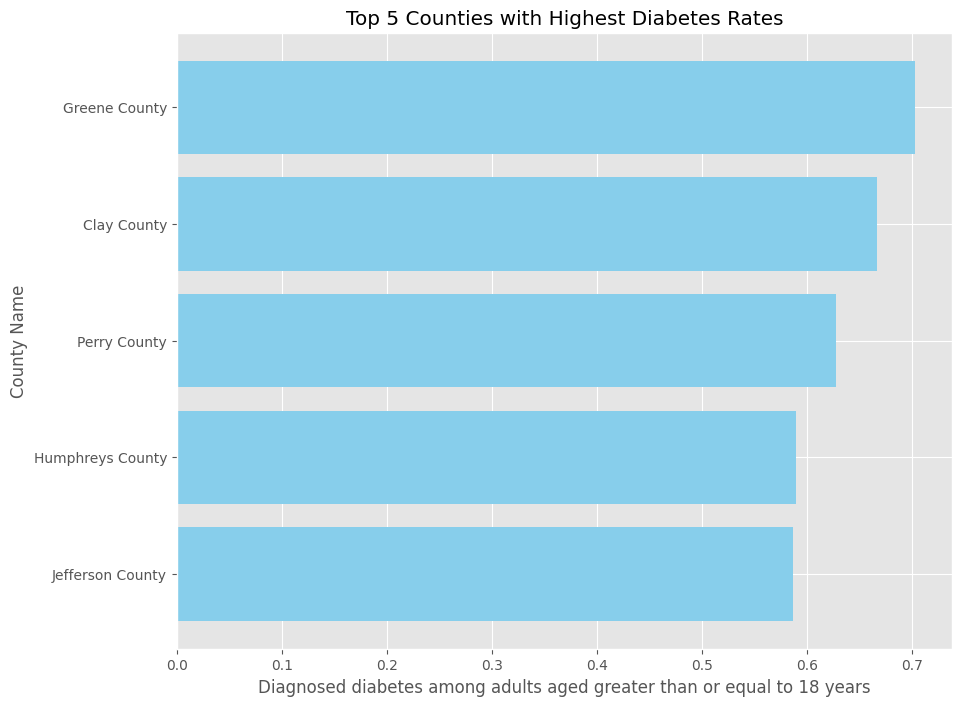

In [26]:
#create a horizontal bar chart for the top 5 counties with highest diabetes rates
top_5_diabetes = health_stats_copy.nlargest(5, 'Diagnosed diabetes among adults aged greater than or equal to 18 years')
top_5_diabetes = top_5_diabetes.sort_values('Diagnosed diabetes among adults aged greater than or equal to 18 years', ascending=True)

plt.barh(top_5_diabetes['County Name'], top_5_diabetes['Diagnosed diabetes among adults aged greater than or equal to 18 years'], color='skyblue')
plt.xlabel('Diagnosed diabetes among adults aged greater than or equal to 18 years')
plt.ylabel('County Name')
plt.title('Top 5 Counties with Highest Diabetes Rates')
plt.show()

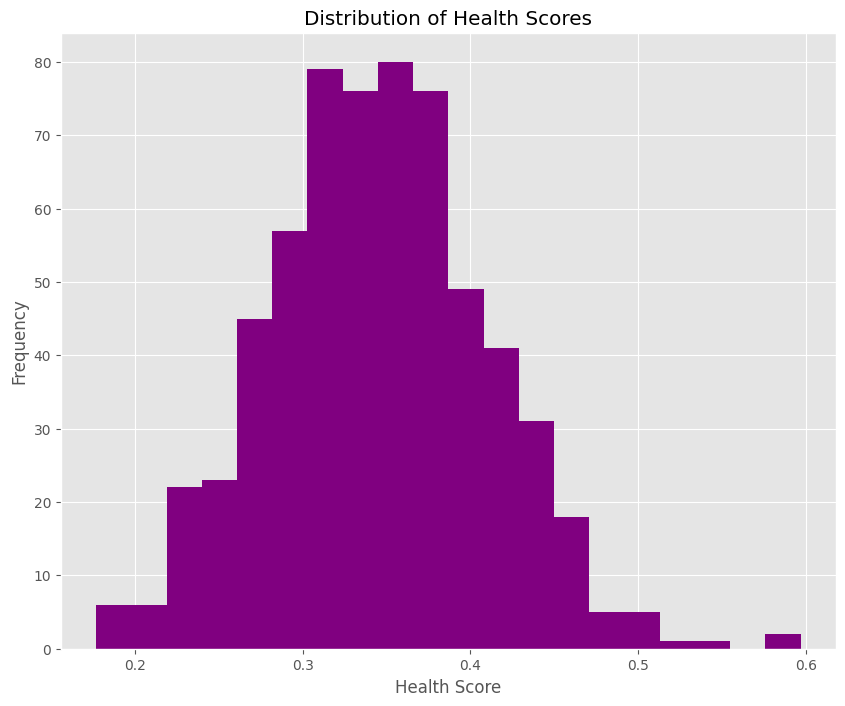

In [33]:
#visualize the distribution of health scores
plt.hist(health_stats_copy['Health Score'], bins=20, color='purple')
plt.xlabel('Health Score')
plt.ylabel('Frequency')
plt.title('Distribution of Health Scores')
plt.show()

In [36]:
#save to html 
county_health_map.save('health_analysis.html')
